In [1]:
pip install segment-anything-py

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.3 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvi

In [2]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2025-11-17 03:07:17--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.227.219.33, 13.227.219.70, 13.227.219.59, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.227.219.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   427MB/s    in 5.7s    

2025-11-17 03:07:23 (428 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 82.8 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [5]:
dataset_path_rgn = "/kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])
        
        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84 
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84 
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8) 
        mask = (mask > 0.5).float()  
        return image, mask
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:    
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)
        
        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0392, 0.1294, 0.1294,  ..., 0.0863, 0.0745, 0.0667],
         [0.0588, 0.1176, 0.1294,  ..., 0.0941, 0.0745, 0.0706],
         [0.1176, 0.1176, 0.1294,  ..., 0.0980, 0.0824, 0.0745],
         ...,
         [0.5412, 0.4980, 0.3961,  ..., 0.3451, 0.3451, 0.3451],
         [0.5412, 0.4980, 0.3922,  ..., 0.3451, 0.3451, 0.3451],
         [0.5412, 0.4980, 0.3922,  ..., 0.3451, 0.3451, 0.3451]],

        [[0.0275, 0.1255, 0.1255,  ..., 0.0902, 0.0784, 0.0706],
         [0.0471, 0.1098, 0.1255,  ..., 0.0980, 0.0784, 0.0745],
         [0.1098, 0.1098, 0.1176,  ..., 0.1059, 0.0863, 0.0784],
         ...,
         [0.5020, 0.4588, 0.3490,  ..., 0.2000, 0.2039, 0.2039],
         [0.5020, 0.4588, 0.3451,  ..., 0.2000, 0.2039, 0.2039],
         [0.5020, 0.4588, 0.3451,  ..., 0.2039, 0.2039, 0.2118]],

        [[0.0039, 0.0941, 0.0941,  ..., 0.0588, 0.0510, 0.0392],
         [0.0196, 0.0824, 0.0941,  ..., 0.0667, 0.0510, 0.0431],
         [0.0824, 0.0824, 0.0902,  ..., 0.0706, 0.0549, 0.

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [0., 1., 1.,  ..., 1., 1., 1.],
         [0., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [24]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [25]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0  
            else:
                iou = 0.0  
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [26]:
from torchvision.ops import masks_to_boxes

def box_from_mask(mask):
    orig_shape = mask.shape 

    if mask.dim() == 4 and mask.shape[1] == 1:
        mask = mask.squeeze(1) 

    bin_mask = mask > 0.5 

    valid_mask = []
    for m in bin_mask:
        if m.sum() == 0:
            valid_mask.append(m.new_zeros(m.shape))
        else:
            valid_mask.append(m)

    valid_mask = torch.stack(valid_mask)

    if valid_mask.sum() == 0:
        B, C, H, W = orig_shape
        box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
    else:
        box = masks_to_boxes(valid_mask)
        if box.numel() == 0: 
            B, C, H, W = orig_shape
            box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
        else:
            box = box.unsqueeze(1)

    return box

In [27]:
def preprocess_image(images, transform, device):
    process_images = []
    for img in images:
        img = img.permute(1, 2, 0).cpu().numpy()
        img_resize = transform.apply_image(img)
        img_resize = torch.as_tensor(img_resize, dtype = torch.float32).permute(2, 0, 1) / 255.0
        process_images.append(img_resize)
    return torch.stack(process_images).to(device)

In [28]:
!pip install optuna

In [29]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau
import optuna
from tqdm import tqdm
import warnings
from segment_anything.utils.transforms import ResizeLongestSide

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, transform, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr = 0.0001)

    num_epoch = 25
    
    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    best_val_loss = float('inf')
    trigger = 0
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0
        num_batches = 0

        for images, masks, _, _ in tqdm(train_loader):
            images = preprocess_image(images, transform, device)
            masks = masks.to(device)

            optimizer.zero_grad()
            image_embeddings = model.image_encoder(images)
            box = box_from_mask(masks).to(device)

            sparse_embeddings, dense_embeddings = model.prompt_encoder(points = None, boxes = box, masks = None)
            low_res_masks, _ = model.mask_decoder(
                image_embeddings = image_embeddings,
                image_pe = model.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings = sparse_embeddings,
                dense_prompt_embeddings = dense_embeddings,
                multimask_output = False
            )

            preds = torch.sigmoid(low_res_masks)
            masks_resized = F.interpolate(masks, size = preds.shape[-2:], mode = "bilinear", align_corners = False)
            masks_resized = (masks_resized > 0.5).float()

            loss = loss_func(preds, masks_resized)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(preds, masks_resized)
            num_batches += 1

        avg_loss = total_loss / num_batches
        avg_iou = total_iou / num_batches
        
        print(f"Epoch {epoch+1}/{num_epoch}")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")
        
        model.eval()
        val_total_loss = 0
        val_total_iou = 0
        val_num_batches = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images = preprocess_image(val_images, transform, device)
                val_masks = val_masks.to(device)

                val_embeddings = model.image_encoder(val_images)
                val_box = box_from_mask(val_masks).to(device)
                val_sparse_embeddings, val_dense_embeddings = model.prompt_encoder(points = None, boxes = val_box, masks = None)

                val_low_res_masks, _ = model.mask_decoder(
                    image_embeddings = val_embeddings,
                    image_pe = model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings = val_sparse_embeddings,
                    dense_prompt_embeddings = val_dense_embeddings,
                    multimask_output = False
                )

                val_preds = torch.sigmoid(val_low_res_masks)
                val_masks_resized = F.interpolate(val_masks, size = val_preds.shape[-2:], mode = "bilinear", align_corners = False)
                val_masks_resized = (val_masks_resized > 0.5).float()

                val_loss = loss_func(val_preds, val_masks_resized)
                val_total_loss += val_loss.item()
                val_total_iou += calc_iou(val_preds, val_masks_resized)
                val_num_batches += 1

        val_avg_loss = val_total_loss / val_num_batches
        val_avg_iou = val_total_iou / val_num_batches

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()
        
        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [30]:
import gc

fine_tune_sam_model = None

def objective(trial):
    global fine_tune_sam_model
    torch.cuda.empty_cache()
    gc.collect()
    
    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.5, 0.5), (0.3, 0.7), (0.2, 0.8)])

    sam_model = sam_model_registry["vit_h"](checkpoint = "sam_vit_h_4b8939.pth").to(device)

    for name, param in sam_model.named_parameters():
        param.requires_grad = False
        if "mask_decoder" in name or "prompt_encoder" in name:
            param.requires_grad = True
    
    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")
    
    transform = ResizeLongestSide(sam_model.image_encoder.img_size)

    model, val_loss = train_model(
        model = sam_model,
        train_loader = train_loader,
        val_loader = val_loader,
        transform = transform,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_sam_model = model

    torch.cuda.empty_cache()
    gc.collect()
    
    return val_loss

In [31]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.5, 0.5)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-17 03:07:51,940] A new study created in memory with name: no-name-5f9cf0d0-e15f-4692-b932-ef2dc33e7c6d


Trial 0: scheduler = cosine, dice weight = 0.5, focal weight = 0.5



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.24689296586439013, Train Avg IoU: 0.5319991193246096



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.22896508665548432, Val Avg IoU: 0.5691236667335033



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 2/25
Train loss: 0.23234497046925956, Train Avg IoU: 0.5454014574384524



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22582961287763384, Val Avg IoU: 0.5675495312445693



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 3/25
Train loss: 0.229959055263963, Train Avg IoU: 0.5788520893418334



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22656216886308458, Val Avg IoU: 0.5590522570742501



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 4/25
Train loss: 0.2297004951785008, Train Avg IoU: 0.5913586371526536



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22556356464823088, Val Avg IoU: 0.6235348474648263



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 5/25
Train loss: 0.22855993691417906, Train Avg IoU: 0.6128647456773453



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22399965425332388, Val Avg IoU: 0.6437014324797524



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 6/25
Train loss: 0.22825817722413275, Train Avg IoU: 0.6317523773759604



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22538545686337683, Val Avg IoU: 0.6806059314144982



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 7/25
Train loss: 0.2278512456557817, Train Avg IoU: 0.639603728092172



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.2241601405872239, Val Avg IoU: 0.630290644036399



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 8/25
Train loss: 0.22833401021651095, Train Avg IoU: 0.6426091038415002



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2235428583290842, Val Avg IoU: 0.6177555306090249



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 9/25
Train loss: 0.22706674877554178, Train Avg IoU: 0.628729261794231



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2250351496040821, Val Avg IoU: 0.6559908787409464



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 10/25
Train loss: 0.22742596247957814, Train Avg IoU: 0.6403510072785947



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2241042343278726, Val Avg IoU: 0.654681978126367



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 11/25
Train loss: 0.22705293653739822, Train Avg IoU: 0.6428093268639512



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22500997078087595, Val Avg IoU: 0.6691889373792542



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 12/25
Train loss: 0.2277358916795088, Train Avg IoU: 0.6561773851669083



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22510909661650658, Val Avg IoU: 0.6254043384558625



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 13/25
Train loss: 0.22719110357057717, Train Avg IoU: 0.6480162072564579



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2243576091196802, Val Avg IoU: 0.6109355559779538



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 14/25
Train loss: 0.22691128459862536, Train Avg IoU: 0.6467282038906382



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2252245433628559, Val Avg IoU: 0.6212558154430654



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 15/25
Train loss: 0.22707898371542493, Train Avg IoU: 0.6609658715315163



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22569742053747177, Val Avg IoU: 0.6586691505379147



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 16/25
Train loss: 0.22678490764357978, Train Avg IoU: 0.6592757286917832



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2240992614792453, Val Avg IoU: 0.6179867767625384



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 17/25
Train loss: 0.2266475629682342, Train Avg IoU: 0.6448978434006373



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22449868958857325, Val Avg IoU: 0.6400530205832587



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 18/25
Train loss: 0.22611407588960397, Train Avg IoU: 0.6561805151609911



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]
[I 2025-11-17 04:03:01,007] Trial 0 finished with value: 0.2235428583290842 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.5, 0.5)}. Best is trial 0 with value: 0.2235428583290842.


Val loss: 0.22432270439134705, Val Avg IoU: 0.649026119046741

Stop at epoch 18
Trial 1: scheduler = reducelr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 1/25
Train loss: 0.24859279244103366, Train Avg IoU: 0.5130026142837273



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22827664431598452, Val Avg IoU: 0.5606056395918131



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 2/25
Train loss: 0.23332692253299886, Train Avg IoU: 0.5734889670921903



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.227370485663414, Val Avg IoU: 0.6232865067819754



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 3/25
Train loss: 0.23094715069358548, Train Avg IoU: 0.6024799109953973



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22641268538104165, Val Avg IoU: 0.593452567855517



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 4/25
Train loss: 0.23074156646099356, Train Avg IoU: 0.6113203216033677



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2264975474940406, Val Avg IoU: 0.5864259960750738



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 5/25
Train loss: 0.23117040128757557, Train Avg IoU: 0.6060398845260756



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22557514905929565, Val Avg IoU: 0.6113575262327989



100%|██████████| 144/144 [02:42<00:00,  1.13s/it]


Epoch 6/25
Train loss: 0.22862383045463097, Train Avg IoU: 0.6326552534010261



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22615864500403404, Val Avg IoU: 0.5756582721239991



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 7/25
Train loss: 0.22794705246471697, Train Avg IoU: 0.6308383154165413



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2245860956609249, Val Avg IoU: 0.6378171336319711



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 8/25
Train loss: 0.22953588877701098, Train Avg IoU: 0.6229318409330316



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22531030575434366, Val Avg IoU: 0.6215951811108325



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 9/25
Train loss: 0.22820401724634898, Train Avg IoU: 0.6509486874565482



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22444869660668904, Val Avg IoU: 0.6520342346694734



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 10/25
Train loss: 0.22959522934009632, Train Avg IoU: 0.6506375738212632



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22476234783728918, Val Avg IoU: 0.6375123146507475



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 11/25
Train loss: 0.22731644877543053, Train Avg IoU: 0.650384943259673



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22571965638134214, Val Avg IoU: 0.6371420249342918



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 12/25
Train loss: 0.22744843399980003, Train Avg IoU: 0.650536079891026



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2259317139784495, Val Avg IoU: 0.6569095725814501



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 13/25
Train loss: 0.22683301004063752, Train Avg IoU: 0.6700351106830769



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22437942773103714, Val Avg IoU: 0.6723843067884445



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 14/25
Train loss: 0.22744274051446053, Train Avg IoU: 0.6644007049293982



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22668870207336214, Val Avg IoU: 0.6581598189142015



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 15/25
Train loss: 0.22702397188792625, Train Avg IoU: 0.6485475392287804



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22466643320189583, Val Avg IoU: 0.6384304869506094



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.2270599285968476, Train Avg IoU: 0.6540054653564261



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2248066547844145, Val Avg IoU: 0.6478245274888145



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.227577723045316, Train Avg IoU: 0.6586937242084079



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2251602742407057, Val Avg IoU: 0.6721632927656174



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 18/25
Train loss: 0.22702513459242052, Train Avg IoU: 0.6636566136342784



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2252413783636358, Val Avg IoU: 0.6554713729355071



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 19/25
Train loss: 0.22714294431110224, Train Avg IoU: 0.6743139415565464



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22425932602749932, Val Avg IoU: 0.6488671998182932



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 20/25
Train loss: 0.22629944405828914, Train Avg IoU: 0.6819184221223824



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22424401260084575, Val Avg IoU: 0.6306383858124415



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 21/25
Train loss: 0.22726174433612162, Train Avg IoU: 0.6560223541325994



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2253294549882412, Val Avg IoU: 0.6221270693673028



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 22/25
Train loss: 0.22676857069341672, Train Avg IoU: 0.6696271377926072



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22486093102229965, Val Avg IoU: 0.6458139030469788



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 23/25
Train loss: 0.22627144224113888, Train Avg IoU: 0.6725829168636765



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22461826354265213, Val Avg IoU: 0.6712281819846895



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 24/25
Train loss: 0.2268362146181365, Train Avg IoU: 0.6762048962215582



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22541127188338173, Val Avg IoU: 0.6775595595439275



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 25/25
Train loss: 0.22635523002180788, Train Avg IoU: 0.6824287133705285



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22495941196878752, Val Avg IoU: 0.6179682831797335



[I 2025-11-17 05:19:39,871] Trial 1 finished with value: 0.22424401260084575 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.5, 0.5)}. Best is trial 0 with value: 0.2235428583290842.


Trial 2: scheduler = steplr, dice weight = 0.5, focal weight = 0.5



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 1/25
Train loss: 0.25004337448626757, Train Avg IoU: 0.5110788310800368



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.227456354846557, Val Avg IoU: 0.5817486498918798



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 2/25
Train loss: 0.23251644123552573, Train Avg IoU: 0.5583756793962998



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22582490576638115, Val Avg IoU: 0.5883642642034425



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.23244734512021145, Train Avg IoU: 0.5821797694079578



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.22689273291163975, Val Avg IoU: 0.5856956169009209



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.22982278906015885, Train Avg IoU: 0.5938215872221109



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22657947656181124, Val Avg IoU: 0.651693306863308



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 5/25
Train loss: 0.2289665295328531, Train Avg IoU: 0.6216372011436356



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22618797711200184, Val Avg IoU: 0.6466623793045679



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 6/25
Train loss: 0.22829527438928685, Train Avg IoU: 0.6052684227729009



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22477843860785165, Val Avg IoU: 0.6077443593078189



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 7/25
Train loss: 0.22842528314019242, Train Avg IoU: 0.6026020325306389



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22592129848069614, Val Avg IoU: 0.6576979284485182



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 8/25
Train loss: 0.2280194825078878, Train Avg IoU: 0.6168624222692516



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22550332753194702, Val Avg IoU: 0.6332669580976168



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 9/25
Train loss: 0.2287032673549321, Train Avg IoU: 0.6238535010359354



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22464759151140848, Val Avg IoU: 0.6195560917258263



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 10/25
Train loss: 0.22869059852220947, Train Avg IoU: 0.6376113367991315



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22490867806805503, Val Avg IoU: 0.6578481561607785



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 11/25
Train loss: 0.2274052373961442, Train Avg IoU: 0.625990735884342



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22437045143710244, Val Avg IoU: 0.6168922881285349



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 12/25
Train loss: 0.22693493962287903, Train Avg IoU: 0.6238435077894893



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22430791788631016, Val Avg IoU: 0.6216232768363423



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 13/25
Train loss: 0.22718554957666331, Train Avg IoU: 0.6222444116655323



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22407888331347042, Val Avg IoU: 0.6201516969336404



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 14/25
Train loss: 0.22687598172989157, Train Avg IoU: 0.6432888048390547



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22492938985427222, Val Avg IoU: 0.6495911735627387



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 15/25
Train loss: 0.22713379261808264, Train Avg IoU: 0.6345624954750141



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22516406286093923, Val Avg IoU: 0.6369353151983685



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 16/25
Train loss: 0.22695744146282473, Train Avg IoU: 0.6484462172310386



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22427353718214565, Val Avg IoU: 0.63985901657078



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 17/25
Train loss: 0.22704900237214234, Train Avg IoU: 0.6467327007816898



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.224375884152121, Val Avg IoU: 0.6357936867409282



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 18/25
Train loss: 0.226797829899523, Train Avg IoU: 0.6466881258206235



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22450552384058634, Val Avg IoU: 0.6362633059422175



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 19/25
Train loss: 0.22653994207373923, Train Avg IoU: 0.6260923095461395



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2244326795140902, Val Avg IoU: 0.6369911672340499



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 20/25
Train loss: 0.22714282215262452, Train Avg IoU: 0.6407733062903086



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22548927573694122, Val Avg IoU: 0.6427997441755401



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 21/25
Train loss: 0.2267441240967148, Train Avg IoU: 0.6392535948091083



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.2248371843662527, Val Avg IoU: 0.6271395029293166



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 22/25
Train loss: 0.2268373832727472, Train Avg IoU: 0.6334357639360759



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22478821749488512, Val Avg IoU: 0.6348793730139732



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 23/25
Train loss: 0.22658961323193377, Train Avg IoU: 0.6353698326792154



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.22453622023264566, Val Avg IoU: 0.6418314948678017

Stop at epoch 23


[I 2025-11-17 06:30:10,750] Trial 2 finished with value: 0.22407888331347042 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.5, 0.5)}. Best is trial 0 with value: 0.2235428583290842.


In [32]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'cosine', 'loss_weight': (0.5, 0.5)}
Best val loss: 0.2235428583290842


In [33]:
fine_tune_sam_model.eval()

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [34]:
def ref_point(gt_mask):
    index = np.argwhere(gt_mask > 0)

    if len(index) > 0:
        if len(index) < 500:
            num_points = 5
        elif len(index) < 2000:
            num_points = 10
        elif len(index) < 10000:
            num_points = 15
        elif len(index) < 30000:
            num_points = 20
        elif len(index) < 50000:
            num_points = 25
        else:
            num_points = 30

        num_points = min(len(index), num_points)
        random_index = np.random.choice(len(index), num_points, replace = False)
        point = index[random_index]
        return point[:, ::-1].astype(np.float32)
    else:
        return np.array([[128, 128]], dtype = np.float32)

In [35]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0
    
    iou = intersection / union

    return iou

In [36]:
predictor_fine_tune = SamPredictor(fine_tune_sam_model)

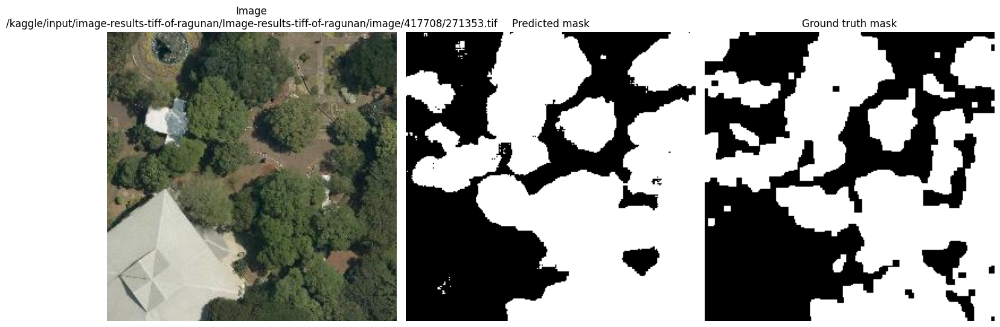

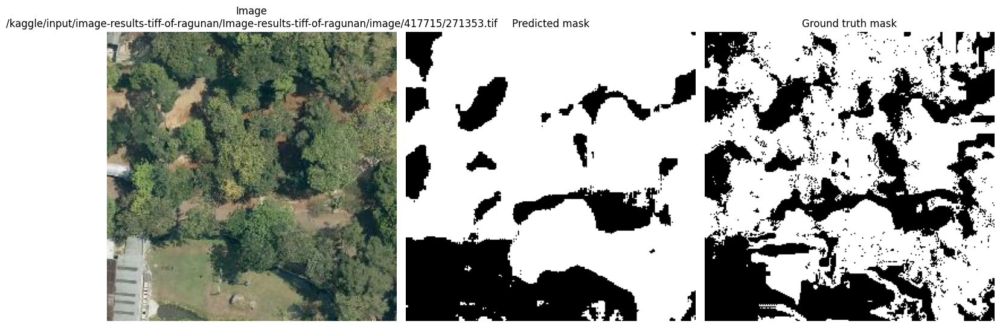

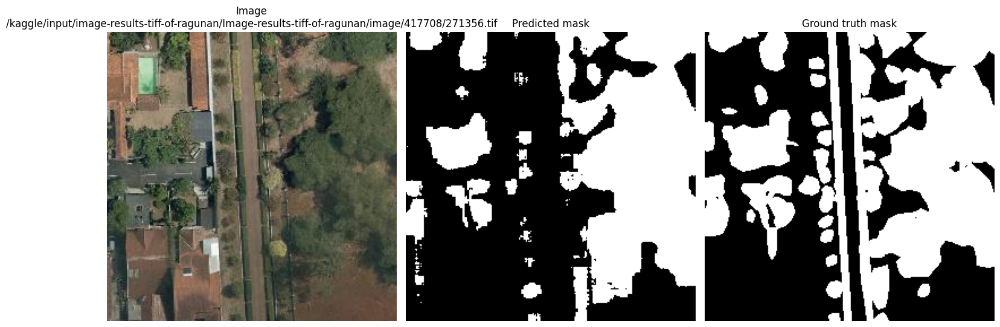

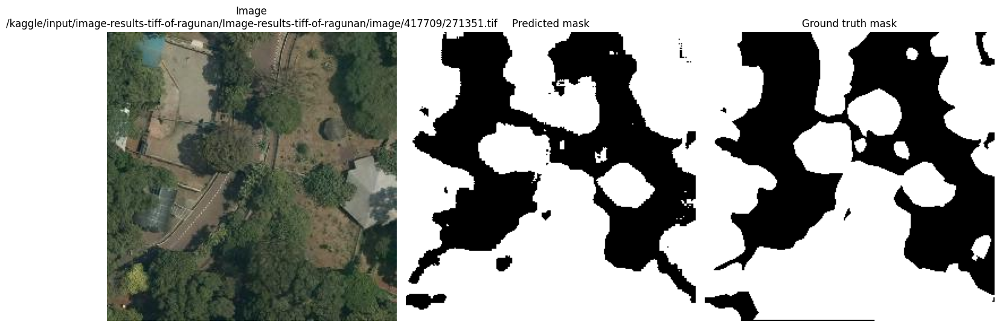

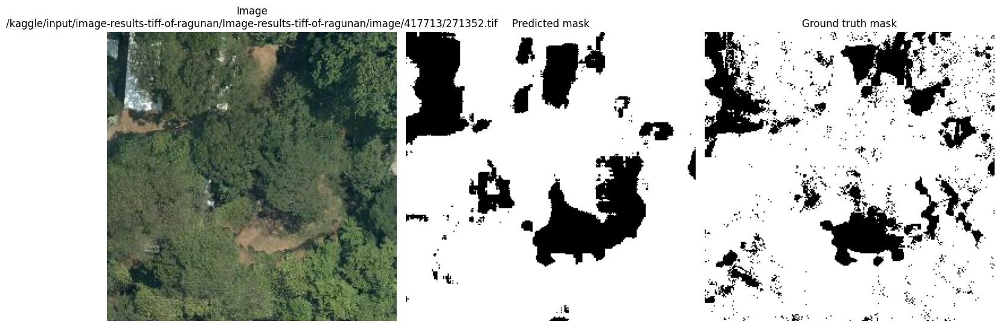

...

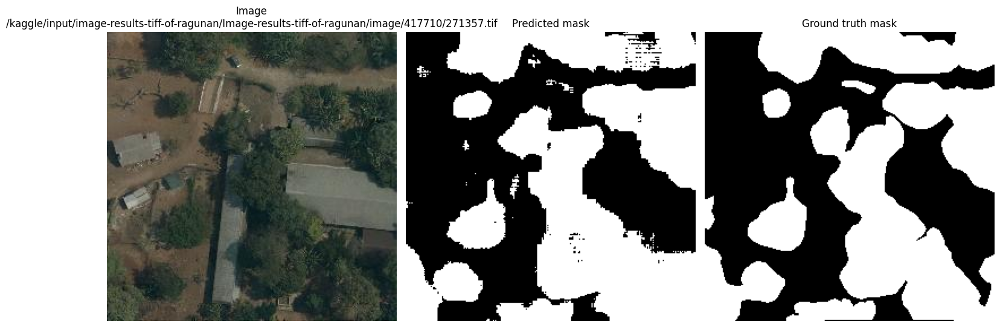

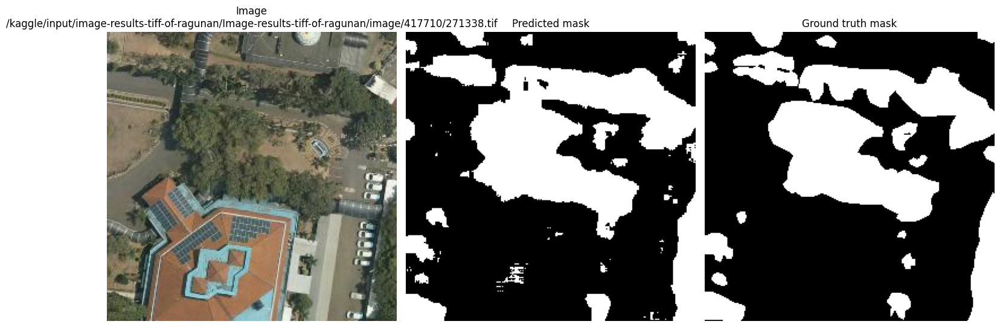

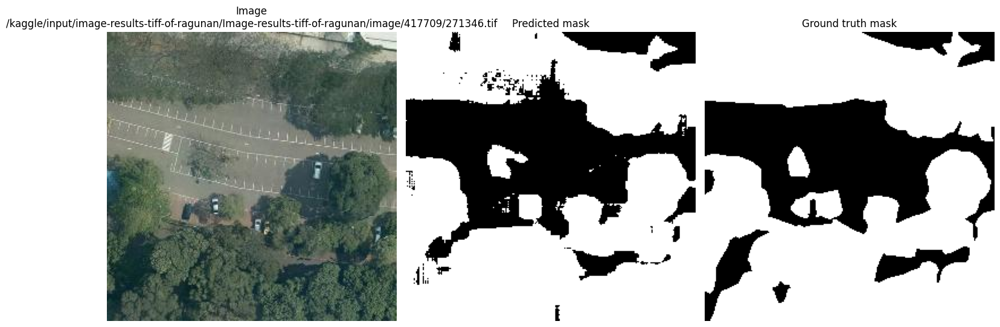

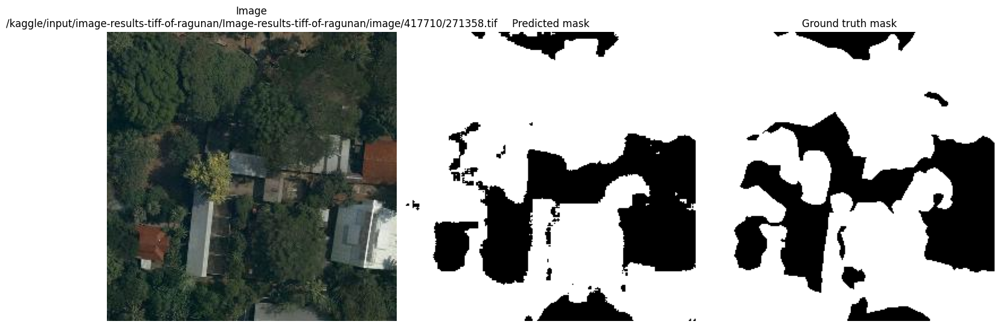

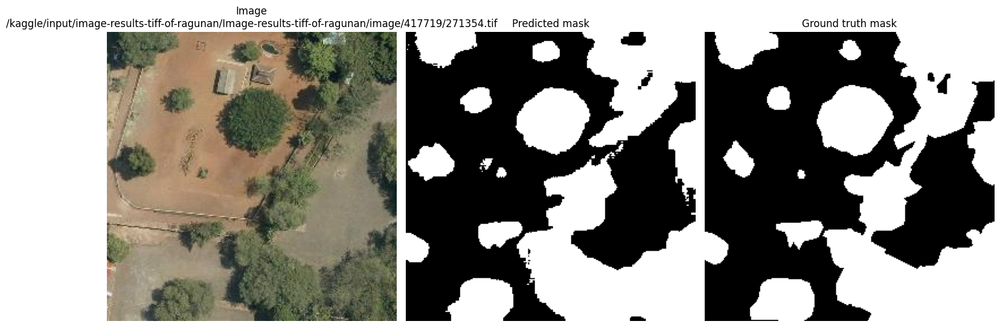

In [37]:
bin_masks = []
gt_masks = []
image_paths = []

for image, mask, image_path, mask_path in test_loader:
    for i in range(len(image_path)): 
        with rasterio.open(image_path[i]) as src:
            img = src.read([1, 2, 3])
            img = np.transpose(img, (1, 2, 0)) 

        gt_mask = cv2.imread(mask_path[i], cv2.IMREAD_GRAYSCALE)

        predictor_fine_tune.set_image(img)

        point = ref_point(gt_mask) 
        if len(point) == 0:
            print(f"No ref points in {mask_path[i]}")
            continue
            
        label = np.ones(len(point), dtype = np.int32)

        masks_fine_tune, scores, logits = predictor_fine_tune.predict(
            point_coords = point, point_labels = label, multimask_output = True
        )

        best_mask = masks_fine_tune[np.argmax(masks_fine_tune.sum(axis = (1, 2)))]
        best_mask = np.clip(best_mask, 0, 1)
        best_mask = (best_mask * 255).astype(np.uint8)

        _, bin_mask = cv2.threshold(best_mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        gt_masks.append(gt_mask)
        bin_masks.append(bin_mask)
        image_paths.append(image_path[i])

        plt.figure(figsize = (15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title(f"Image\n{image_path[i]}")
        plt.axis("off")
    
        plt.subplot(1, 3, 2)
        plt.imshow(bin_mask, cmap = "gray")
        plt.title("Predicted mask")
        plt.axis("off")
    
        plt.subplot(1, 3, 3)
        plt.imshow(gt_mask, cmap = "gray")
        plt.title("Ground truth mask")
        plt.axis("off")
    
        plt.tight_layout()
        plt.show()

In [38]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 37766
Vegetation coverage area: 21255.834492467093
IoU score: 0.7749328470391089
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 46636
Vegetation coverage area: 3623.9870133256068
IoU score: 0.7316563529695411
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 26339
Vegetation coverage area: 14824.377077188234
IoU score: 0.6711182901150884
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40138
Vegetation coverage area: 22590.86704598433
IoU score: 0.8302500175409875
Image /kaggle/input/i

In [51]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 21255.834492467093 m^2
Carbon density: 0.007208048785948712 ton/m^2
Estimated carbon stock: 153.2130920077542 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3623.9870133256068 m^2
Carbon density: 0.007208048785948712 ton/m^2
Estimated carbon stock: 26.12187519169554 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 14824.377077188234 m^2
Carbon density: 0.007208048785948712 ton/m^2
Estimated carbon stock: 106.85483319367256 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 22590.86704598433 m^2
Carbon density: 0.007208048785948712 ton/m^2
Estimated carbon stock: 162.83607178433613 ton
Image /kaggle/input/ima